# Use rate distances to calculate functional subpopulations



In [1]:
import numpy as np 
import sys
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import scipy
import os
import importlib
import pandas as pd
import networkx as nx
from sklearn.metrics import pairwise_distances

sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils')
import load_data as ld 
import single_neuron_utils as sn 
import connectivity_utils as cu
import bhv_utils as bhv
from bootstrap_method import *



In [2]:
delay = 150
condn_phrase = 'delay'
condn_num = delay

# condn_key = f'{condn_phrase}{condn_num}'

In [3]:
# find folder names within model directory
all_models_dir = '/home/nuttidalab/Documents/renee/all_DMS_models/'

model_dirs = ld.get_immediate_subdirs(all_models_dir)
print(model_dirs)


['Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_231815', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_11_06_084645', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_212818', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_07_011809', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_163926', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_160648', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_225459', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_165543', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_221440', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_225727', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_175711', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_174328', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_204320', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_212723', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_234449', 'Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_07_032739', 'Task_x

In [4]:
# choose model 0 to visualize for now
model_name = model_dirs[1] # start w a good model
model_dir = os.path.join(all_models_dir, model_name)

# find files for this delay of interest
data_files = ld.find_files_keywords(model_dir, [f'delay{delay}'])
print(data_files)

['/home/nuttidalab/Documents/renee/all_DMS_models/Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_11_06_084645/neuraldata_raw_delay150.mat', '/home/nuttidalab/Documents/renee/all_DMS_models/Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_11_06_084645/bhvdata_raw_delay150.mat', '/home/nuttidalab/Documents/renee/all_DMS_models/Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_11_06_084645/timingdata_raw_delay150.mat']


In [5]:
# neural data
importlib.reload(ld)
lfp_data, spk_times_df, rates_data = ld.load_neural_data(model_name, condn_phrase, condn_num,
                                                  load_LFP=False, load_spikes=False, load_rates=True)
# behavioral data
trial_labels, trial_perfs = ld.load_bhv_data(model_name, condn_phrase='delay', condn_num=delay)

# timing data
_, times_real, fs_dict = ld.load_timing_data(model_name, condn_phrase='delay', condn_num=delay)
times_ms, _,_ = ld.get_times_dict('ds', condn_phrase, condn_num, model_name)

# get connectivity info
connectivity_df = ld.get_connectivity_df(model_name)

/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


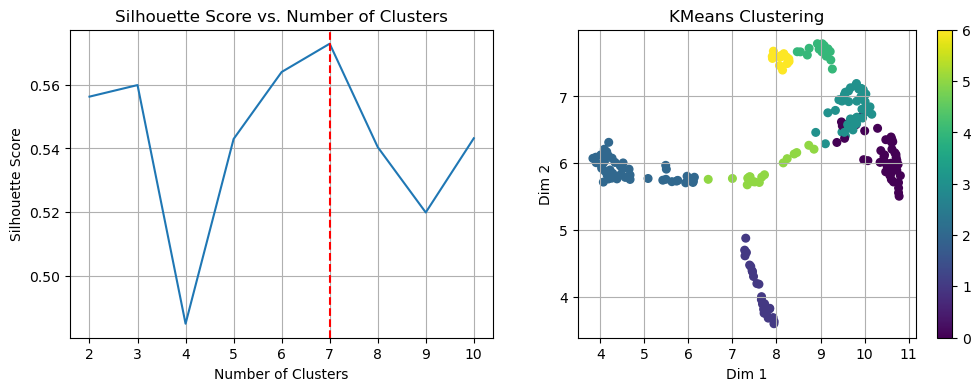

In [7]:
importlib.reload(sn)

labels = sn.calc_subpop(model_name, condn_phrase, condn_num, method='rate_dist', rates_data=rates_data, plot=True)

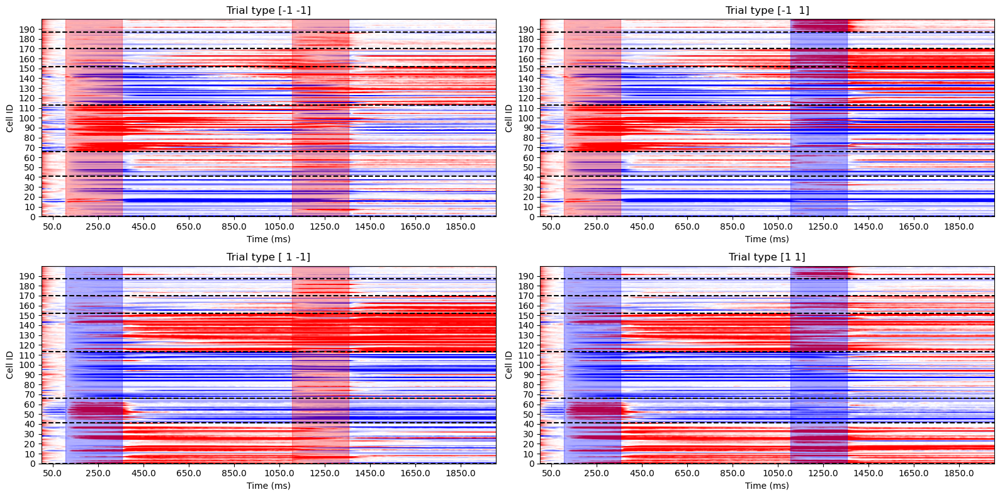

In [8]:
importlib.reload(sn)

sn.plot_rates_by_cluster(model_name, condn_phrase, condn_num, rates_data=rates_data, labels=labels)

(200, 4, 2005)


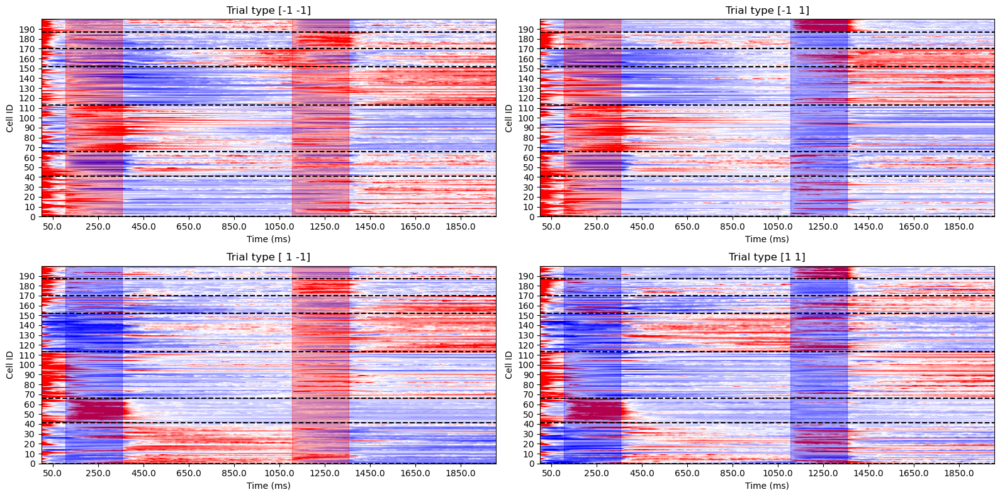

In [35]:
importlib.reload(sn)
# via z-score
sn.plot_rates_by_cluster(model_name, condn_phrase, condn_num, rates_data=rates_data, labels=labels)

In [12]:
rates_data.shape

(2055, 200, 1000)

In [15]:
cell_meanfrs.shape

(41, 2005)

In [19]:
exc_ind, inh_ind = ld.get_celltype_label(model_name)
exc = np.zeros(rates_data.shape[1])
exc[exc_ind] = 1

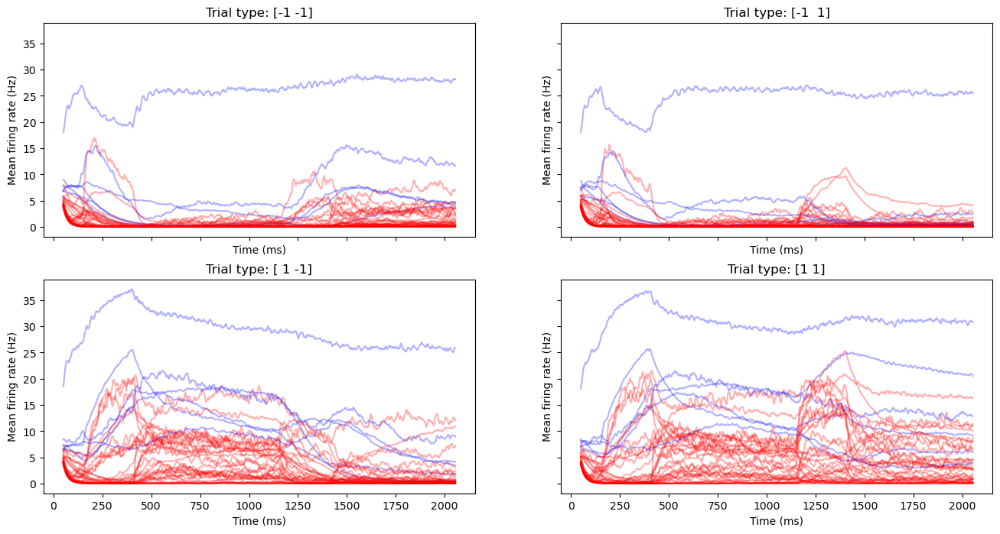

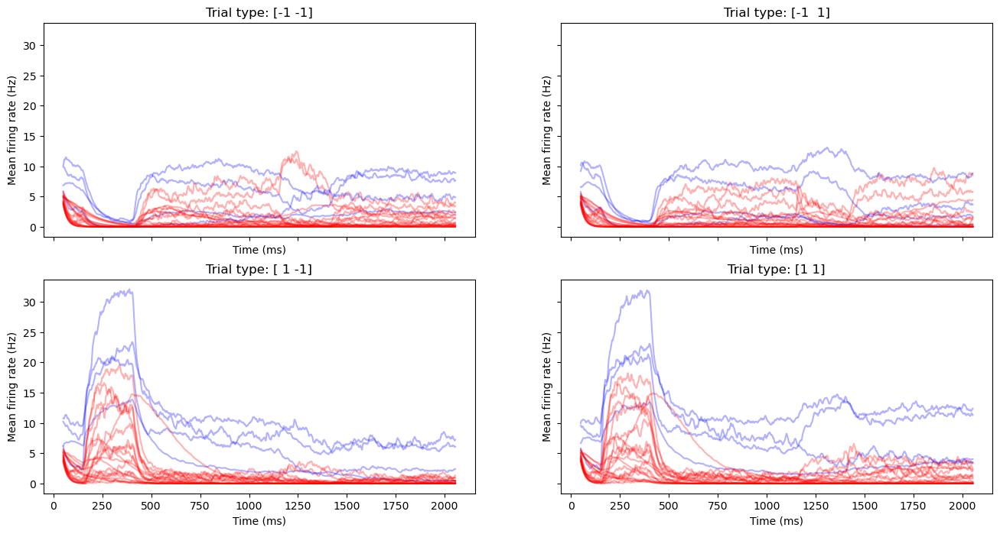

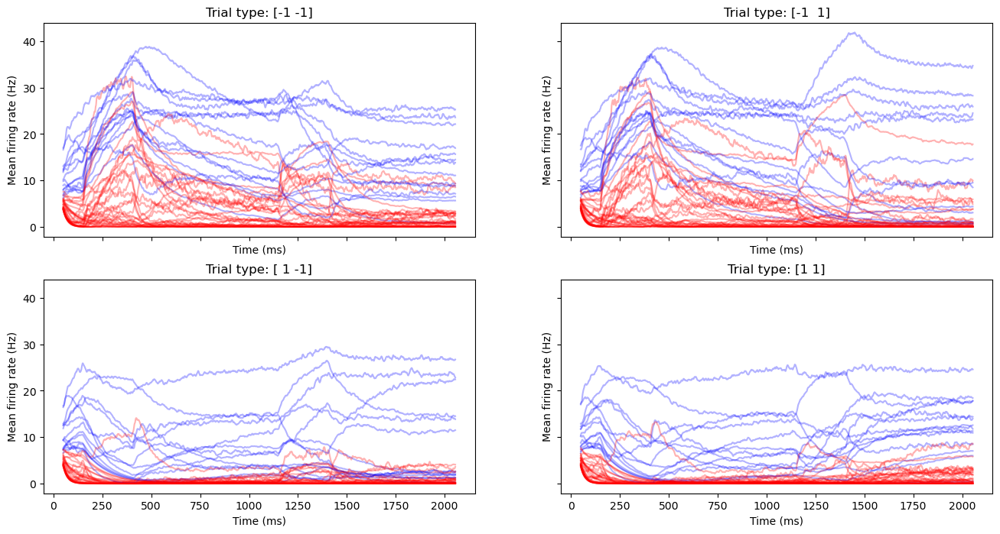

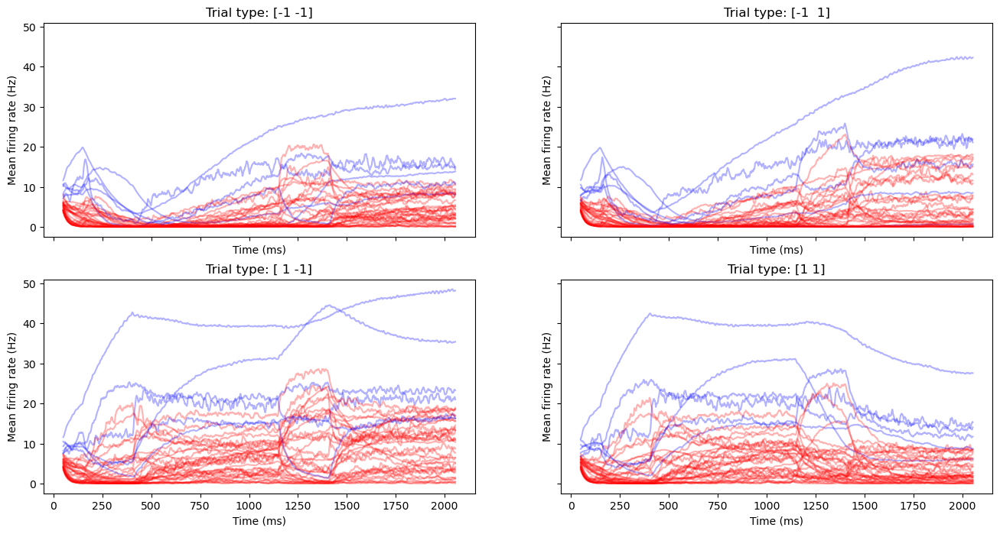

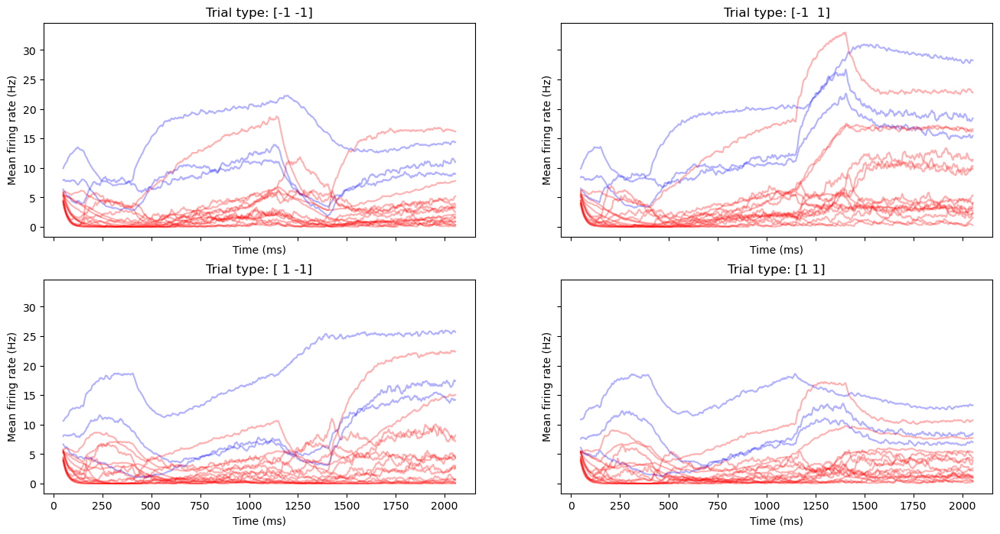

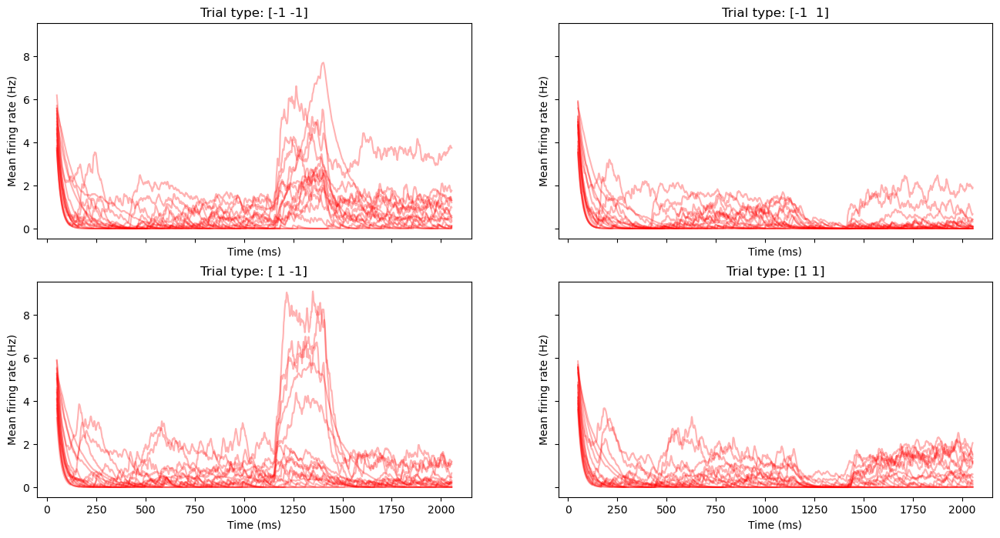

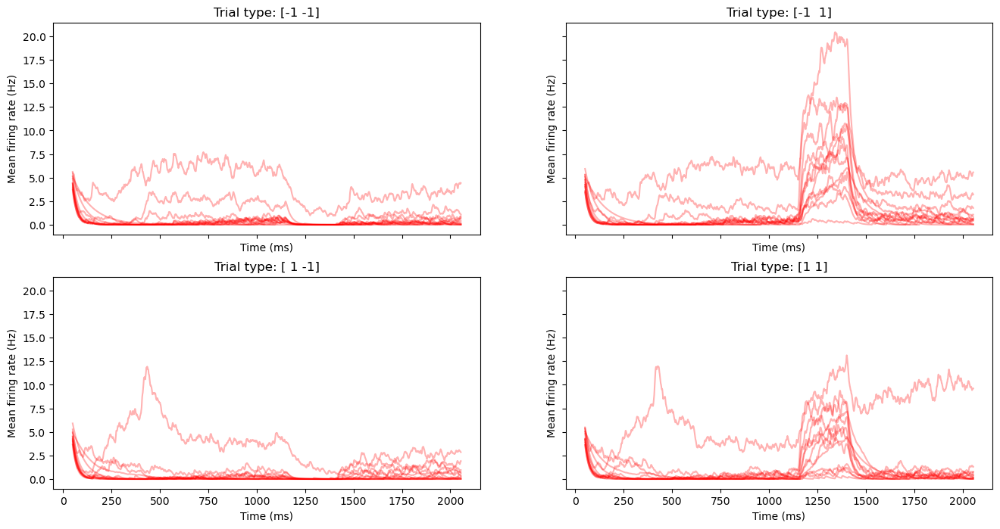

In [23]:
cut_off = 50
unique, unique_idx = np.unique(labels, return_inverse=True)
for i in unique:
    fig, axs = plt.subplots(2,2,figsize=(16,8), sharex=True, sharey=True)
    axs = axs.flatten()

    subpop_idxs = (unique_idx == i)
    subpop_rates = rates_data[:, subpop_idxs, :]  # shape: [time, cell, trial]

    subpop_identity = exc[subpop_idxs]
    colors = ['r' if x == 1 else 'b' for x in subpop_identity] #exc is red

    trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)

    for j, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == j)
        trials_rate = subpop_rates[cut_off:, :, trials_idx]  # shape: [time, cell, trial]
        cell_meanfrs = np.mean(trials_rate, axis=2).T  # mean over trials, transpose to match shape

        # axs[j].plot(np.arange(cut_off,times_ms['T']), cell_meanfrs.T, alpha=0.3)
        for k in range(cell_meanfrs.shape[0]):
            axs[j].plot(np.arange(cut_off,times_ms['T']), cell_meanfrs[k], color=colors[k], alpha=0.3)
        axs[j].set_title(f'Trial type: {trial_type}')
        axs[j].set_xlabel('Time (ms)')
        axs[j].set_ylabel('Mean firing rate (Hz)')



In [24]:
cell_meanfrs.shape

(13, 2005)

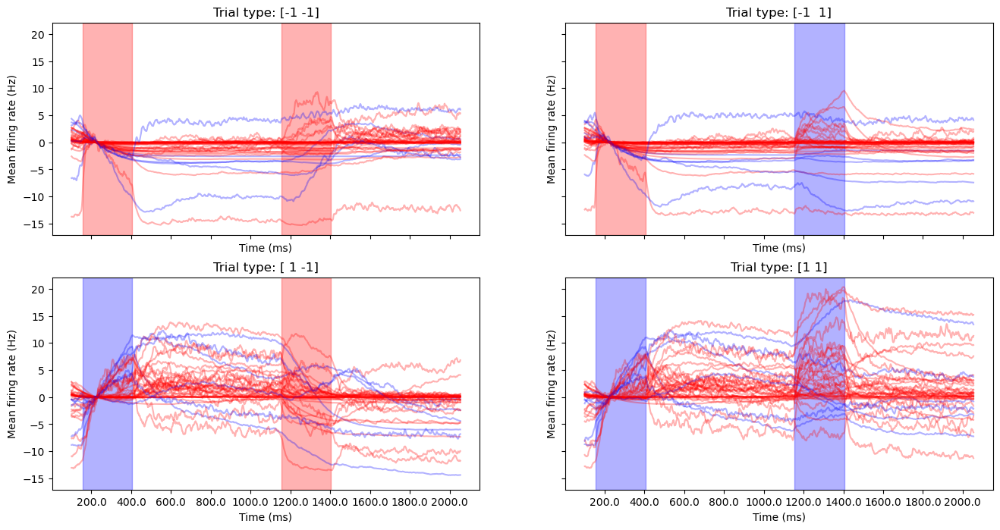

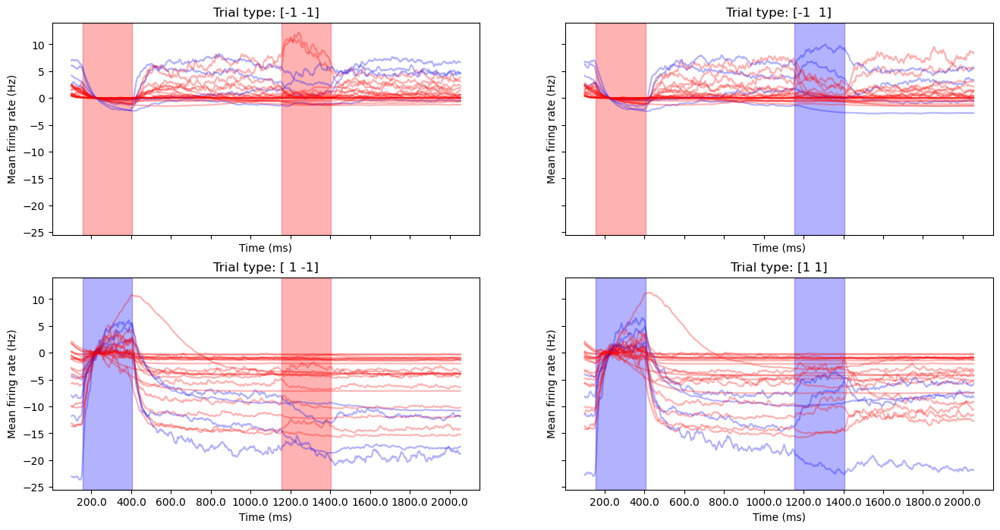

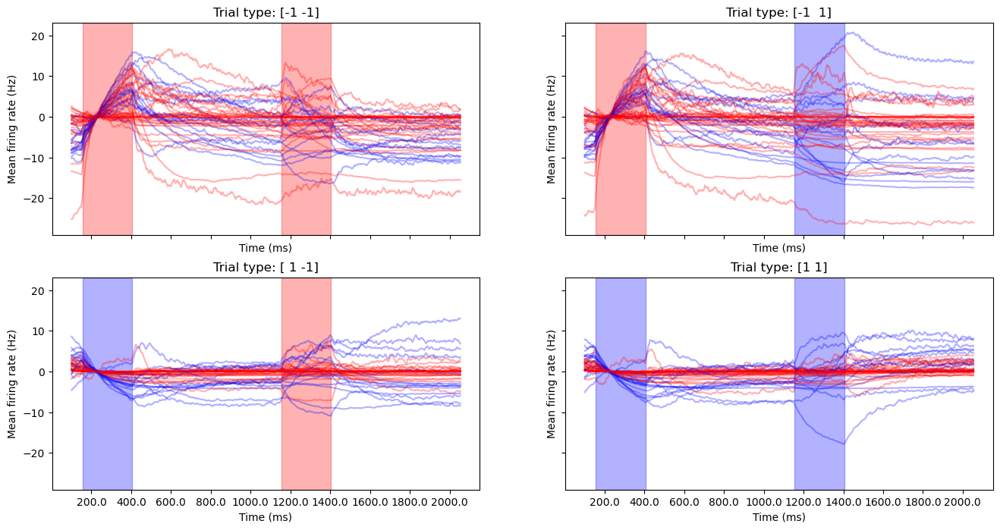

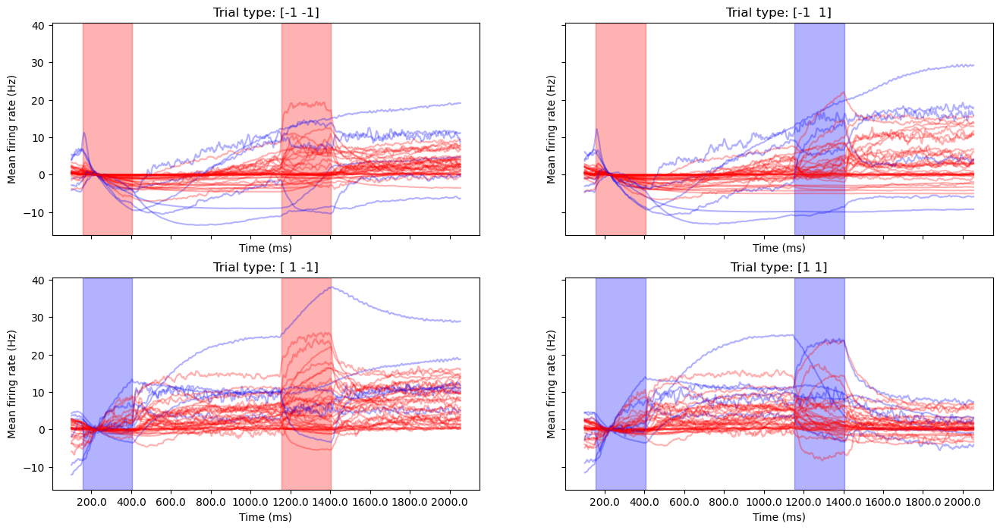

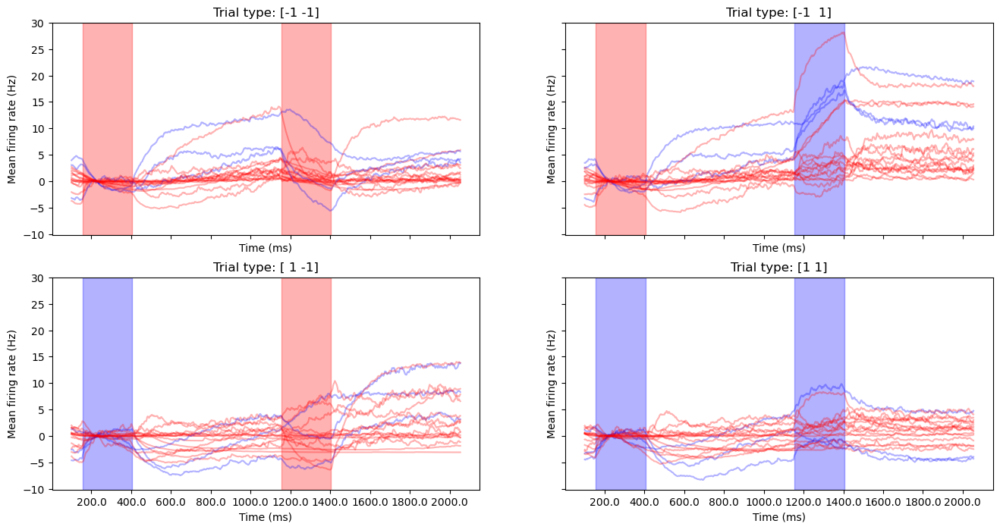

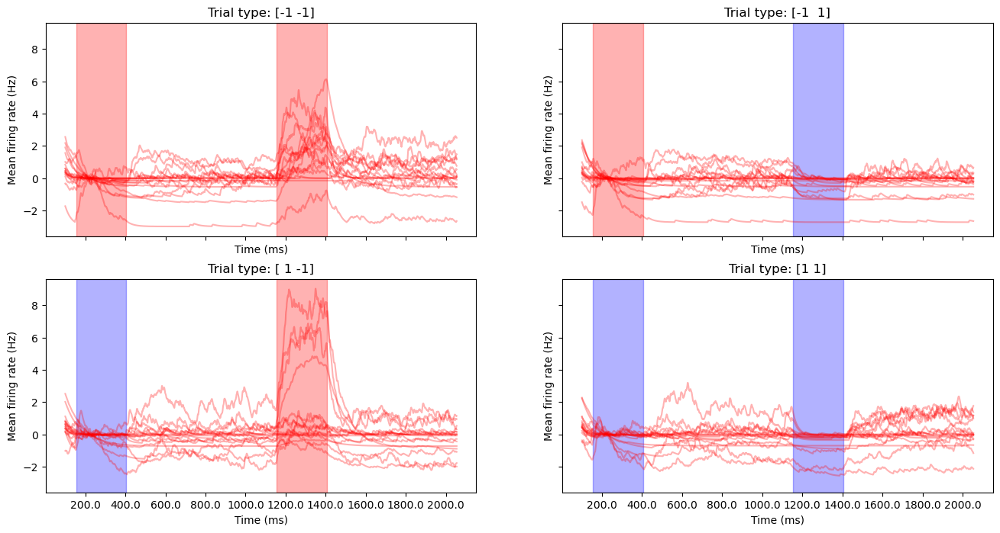

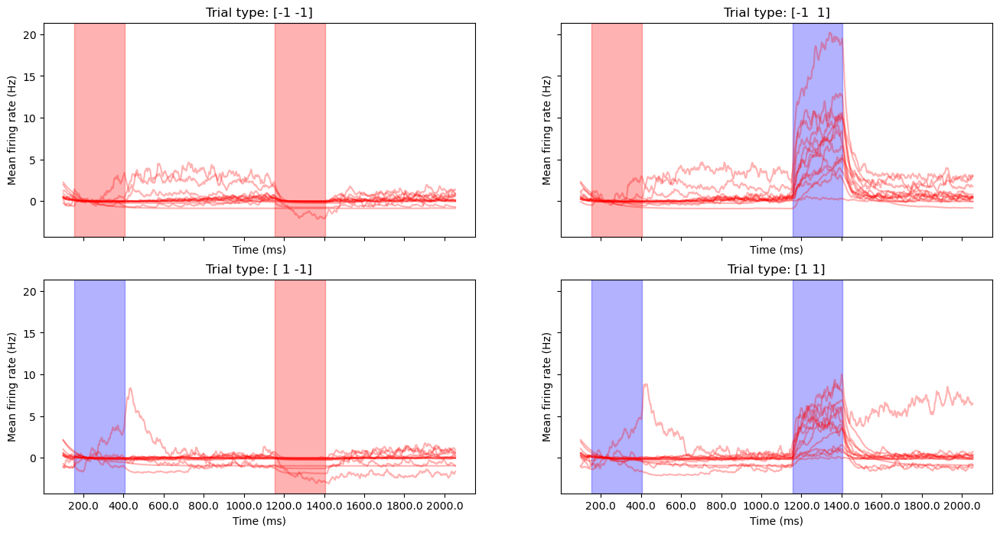

In [ ]:
# repeat but normalize rates (baseline subtracted)


cut_off = 100
unique, unique_idx = np.unique(labels, return_inverse=True)
for i in unique:
    fig, axs = plt.subplots(2,2,figsize=(16,8), sharex=True, sharey=True)
    axs = axs.flatten()

    subpop_idxs = (unique_idx == i)
    subpop_rates = rates_data[:, subpop_idxs, :]  # shape: [time, cell, trial]

    subpop_identity = exc[subpop_idxs]
    colors = ['r' if x == 1 else 'b' for x in subpop_identity] #exc is red

    trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)

    for j, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == j)
        trials_rate = subpop_rates[cut_off:, :, trials_idx]  # shape: [time, cell, trial]
        cell_meanfrs = np.mean(trials_rate, axis=2).T  # mean over trials, transpose to match shape
        # normalize by subtracting baseline
        baseline = np.mean(cell_meanfrs[:, cut_off:int(times_ms['stim1_on'])], axis=1)
        cell_meanfrs = cell_meanfrs - baseline[:, np.newaxis]  # subtract baseline from each cell

        # axs[j].plot(np.arange(cut_off,times_ms['T']), cell_meanfrs.T, alpha=0.3)
        for k in range(cell_meanfrs.shape[0]):
            axs[j].plot(np.arange(cut_off,times_ms['T']), cell_meanfrs[k], color=colors[k], alpha=0.3)
        # fix xticks
        xticks = np.arange(0, times_ms['T'], 200)
        axs[j].set_xticks(xticks)
        axs[j].set_xticklabels(xticks)

        axs[j].set_title(f'Trial type: {trial_type}')
        axs[j].set_xlabel('Time (ms)')
        axs[j].set_ylabel('Mean firing rate (Hz)')

        # shade stims
        stim_colors = sn.get_stim_plotting_colors(trial_type)
        axs[j].axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color=stim_colors[0], alpha=0.3)
        axs[j].axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color=stim_colors[1], alpha=0.3)



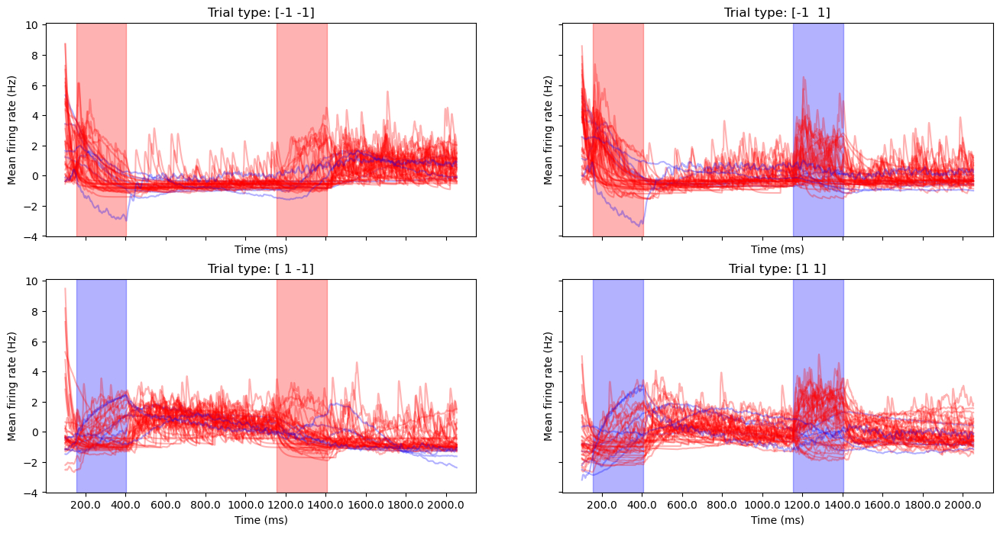

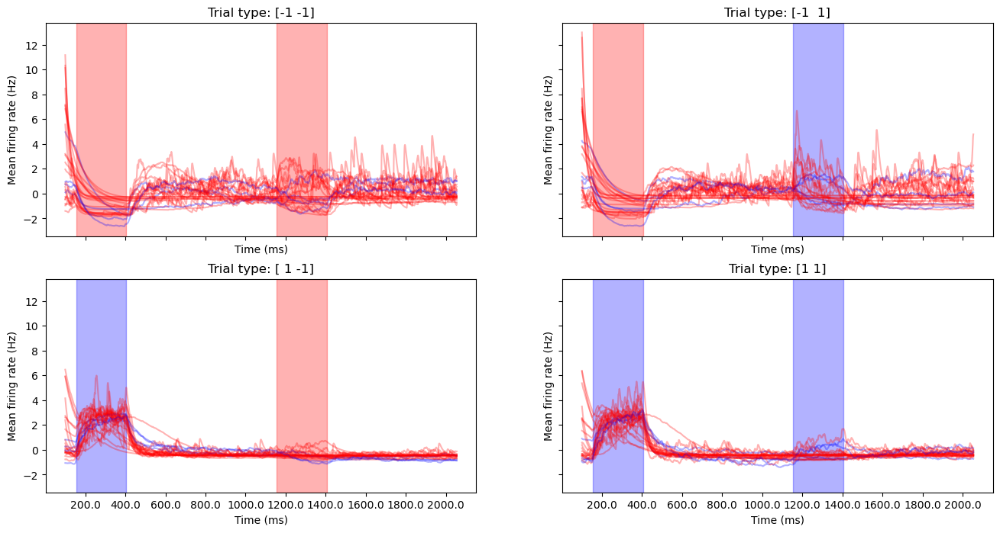

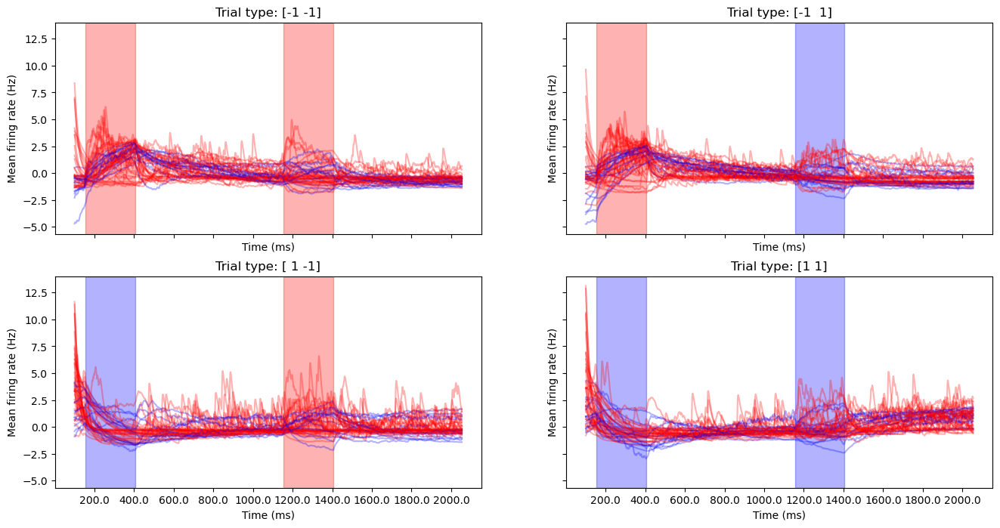

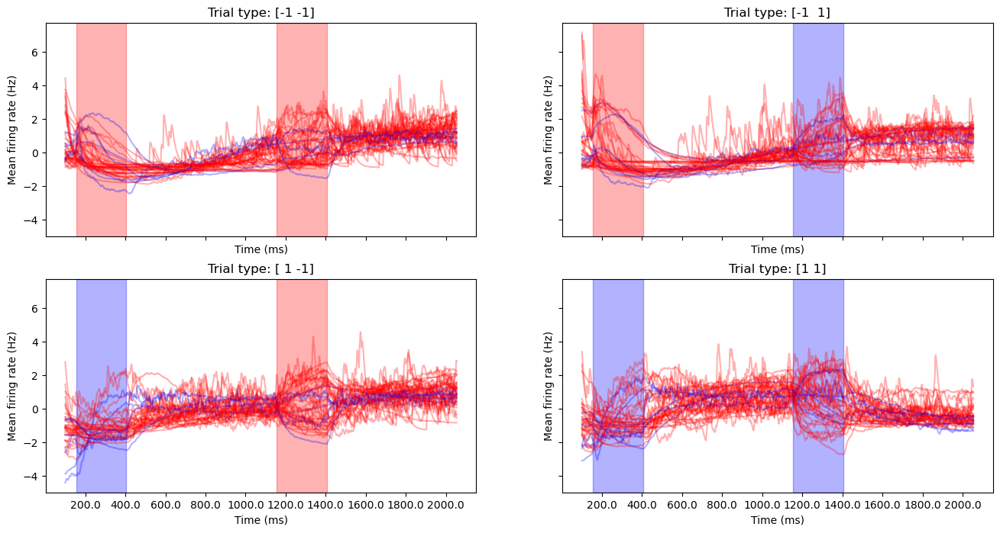

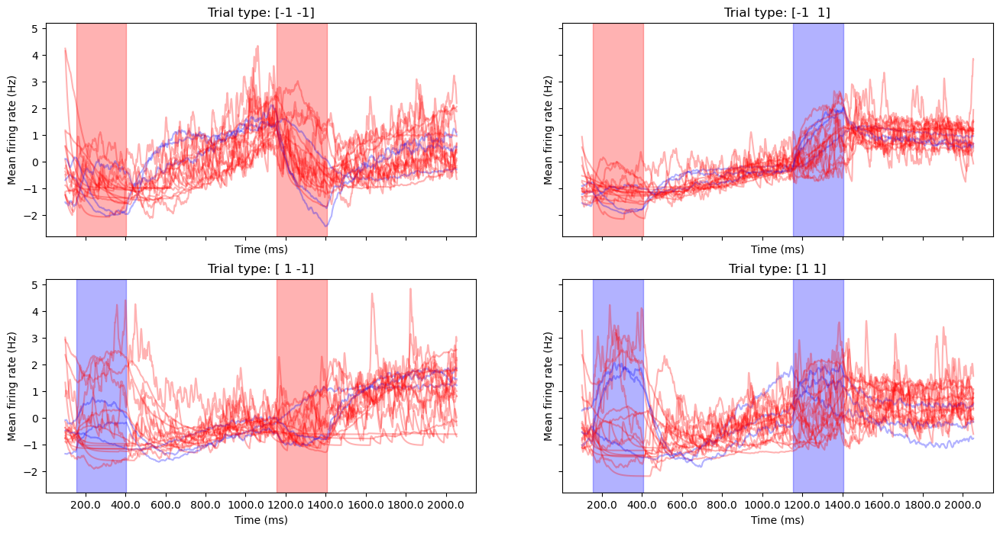

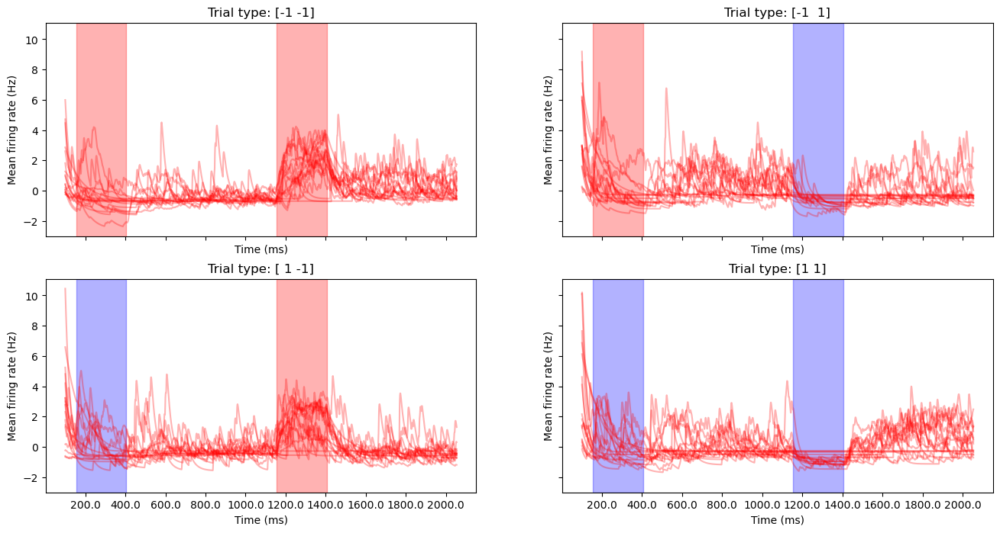

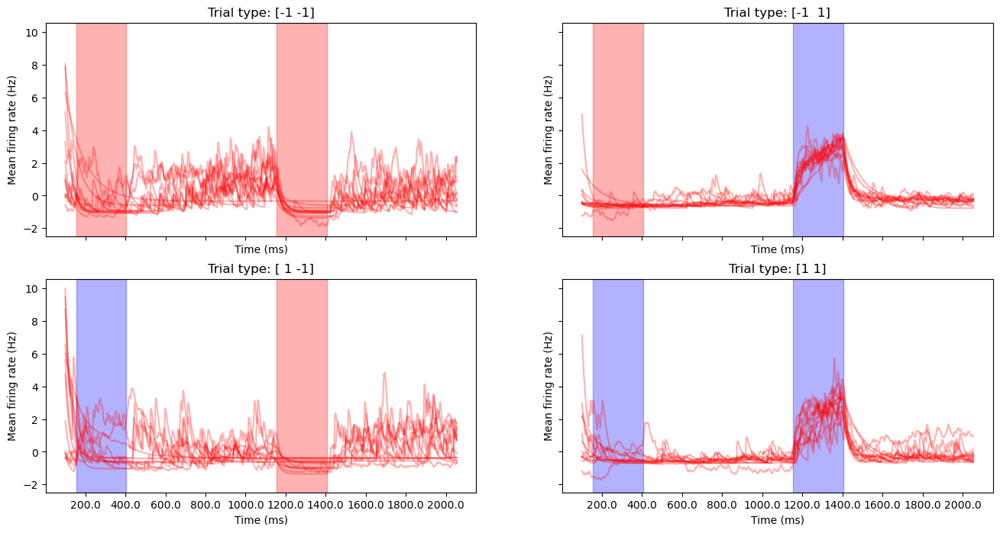

In [34]:
# repeat but normalize rates (z-score)


cut_off = 100
unique, unique_idx = np.unique(labels, return_inverse=True)
for i in unique:
    fig, axs = plt.subplots(2,2,figsize=(16,8), sharex=True, sharey=True)
    axs = axs.flatten()

    subpop_idxs = (unique_idx == i)
    subpop_rates = rates_data[:, subpop_idxs, :]  # shape: [time, cell, trial]

    subpop_identity = exc[subpop_idxs]
    colors = ['r' if x == 1 else 'b' for x in subpop_identity] #exc is red

    trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)

    for j, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == j)
        trials_rate = subpop_rates[cut_off:, :, trials_idx]  # shape: [time, cell, trial]
        cell_meanfrs = np.mean(trials_rate, axis=2).T  # mean over trials, transpose to match shape
        # normalize by zscoring
        cell_meanfrs = scipy.stats.zscore(cell_meanfrs, axis=1)

        # axs[j].plot(np.arange(cut_off,times_ms['T']), cell_meanfrs.T, alpha=0.3)
        for k in range(cell_meanfrs.shape[0]):
            axs[j].plot(np.arange(cut_off,times_ms['T']), cell_meanfrs[k], color=colors[k], alpha=0.3)
        # fix xticks
        xticks = np.arange(0, times_ms['T'], 200)
        axs[j].set_xticks(xticks)
        axs[j].set_xticklabels(xticks)

        axs[j].set_title(f'Trial type: {trial_type}')
        axs[j].set_xlabel('Time (ms)')
        axs[j].set_ylabel('Mean firing rate (Hz)')

        # shade stims
        stim_colors = sn.get_stim_plotting_colors(trial_type)
        axs[j].axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color=stim_colors[0], alpha=0.3)
        axs[j].axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color=stim_colors[1], alpha=0.3)



### check "tuning" for each subpop

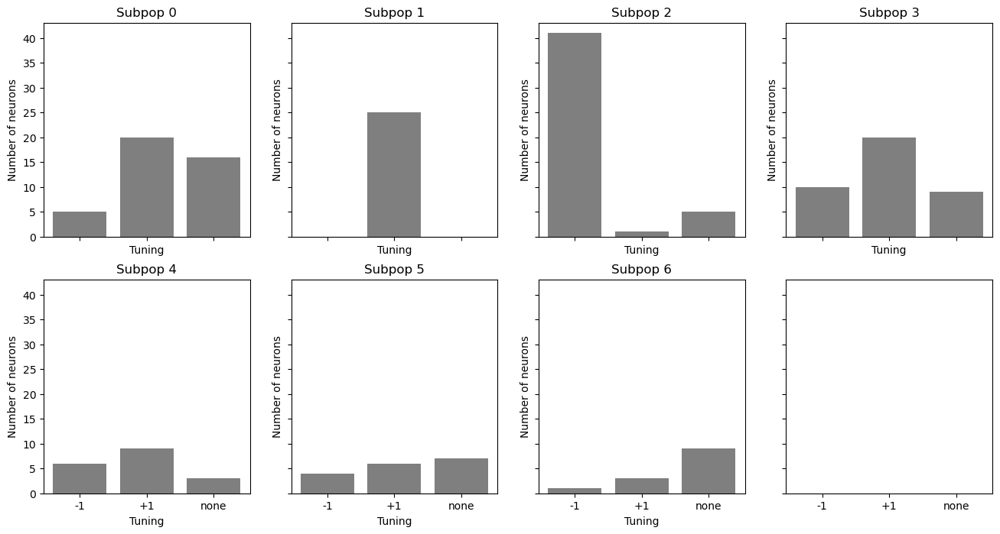

In [33]:
tuning = sn.calc_stim1_tuning(model_name, condn_phrase, condn_num, rates_data=rates_data)

fig, axs = plt.subplots(2,4,figsize=(16,8), sharex=True, sharey=True)
axs = axs.flatten()
for i in unique:
    subpop_idxs = (unique_idx == i)
    sn.plot_stim1_tuning(tuning, subpop_idxs, axs[i], title=f'Subpop {i}')